# **Como usar NLTK en Google Colab**

In [ ]:
#seleccionar download [d], luego descargar el recurso de nombre "book"
import nltk
nltk.download('cess_esp')

[nltk_data] Downloading package cess_esp to /root/nltk_data...
[nltk_data]   Unzipping corpora/cess_esp.zip.


True

# **Expresiones Regulares**


*   Constituyen un lenguaje estandarizado para definir cadenas de búsqueda de texto.
*   Libreria de operaciones con  expresiones regulares de Python [re](https://docs.python.org/3/library/re.html)
*   Reglas para escribir expresiones regulares [Wiki](https://es.wikipedia.org/wiki/Expresión_regular)



In [ ]:
# spanish Corpus: https://mailman.uib.no/public/corpora/2007-October/005448.html
import re
corpus = nltk.corpus.cess_esp.sents()
print(corpus)
print(len(corpus))

[['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation', 'para', 'poner_en_marcha', 'una', 'central', 'de', 'gas', 'de', '495', 'megavatios', '.'], ['Una', 'portavoz', 'de', 'EDF', 'explicó', 'a', 'EFE', 'que', 'el', 'proyecto', 'para', 'la', 'construcción', 'de', 'Altamira_2', ',', 'al', 'norte', 'de', 'Tampico', ',', 'prevé', 'la', 'utilización', 'de', 'gas', 'natural', 'como', 'combustible', 'principal', 'en', 'una', 'central', 'de', 'ciclo', 'combinado', 'que', 'debe', 'empezar', 'a', 'funcionar', 'en', 'mayo_del_2002', '.'], ...]
6030


In [ ]:
flatten = [w for l in corpus for w in l]
print(flatten[:20])
print(len(flatten))

['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana']
192686


### **Estructura de la funcion re.search()**
```
# Determina si el patron de búsqueda p esta contenido en la cadena s
re.seach(p, s)
```



In [ ]:
# Meta-caracteres básicos
arr = [w for w in flatten if re.search('es', w)]
arr[:5]

['estatal', 'jueves', 'empresa', 'centrales', 'francesa']

In [ ]:
arr1 = [w for w in flatten if re.search('es$', w)] # es debe estar al final de la palabra
arr1[:5]

['jueves', 'centrales', 'millones', 'millones', 'dólares']

In [ ]:
arr2 = [w for w in flatten if re.search('^es', w)] # con el simbolo ^ al principio de 'es' debe estar al principio de la palabra
arr2[:5]

['estatal', 'es', 'esta', 'esta', 'eso']

In [ ]:
arr = [w for w in flatten if re.search('^..j..t..$', w)]
arr

Rangos sirven para bucar mas letras

In [ ]:
#Rangos [a-z], [A-Z], [0-9]
arr4 = [w for w in flatten if re.search('^[ghi][mno][jlk][def]$', w)]
arr4

In [ ]:
#Clausuras *, * (Kleene closures)
# * Repetir 0 o mas veces
# + Repetir 1 o mas veces
arr5 = [w for w in flatten if re.search('^(no)*', w)]
arr5[:10]

['El',
 'grupo',
 'estatal',
 'Electricité_de_France',
 '-Fpa-',
 'EDF',
 '-Fpt-',
 'anunció',
 'hoy',
 ',']

In [ ]:
arr6 = [w for w in flatten if re.search('(no)+', w)]
arr6[:10]

['norte',
 'no',
 'no',
 'noche',
 'no',
 'no',
 'gobierno',
 'notificación',
 'Unión_Fenosa_Inversiones',
 'italiano']

# **Normalización de Texto** (como aplicación de las expresiones regulares)


## **Tokenización:** Es el proceso mediante el cual se sub-divide una cadena de texto en unidades linguísticas minimas (palabras)


In [ ]:
texto = """ Cuando sea el rey del mundo  (imaginaba él en su cabeza) no tendré que  preocuparme por estas bobadas.
            Era solo un niño de 7 años, pero pensaba que podría ser cualquier cosa que su imaginación le permitiera visualizar en su cabeza ..."""
print(texto)

 Cuando sea el rey del mundo  (imaginaba él en su cabeza) no tendré que  preocuparme por estas bobadas.
            Era solo un niño de 7 años, pero pensaba que podría ser cualquier cosa que su imaginación le permitiera visualizar en su cabeza ...


In [ ]:
# Caso 1: tokenizacion más simple: por espacios vacios !
print(re.split(r' ', texto)) # Esa r permite incluir caracteres especiales

['', 'Cuando', 'sea', 'el', 'rey', 'del', 'mundo', '', '(imaginaba', 'él', 'en', 'su', 'cabeza)', 'no', 'tendré', 'que', '', 'preocuparme', 'por', 'estas', 'bobadas.\n', '', '', '', '', '', '', '', '', '', '', '', 'Era', 'solo', 'un', 'niño', 'de', '7', 'años,', 'pero', 'pensaba', 'que', 'podría', 'ser', 'cualquier', 'cosa', 'que', 'su', 'imaginación', 'le', 'permitiera', 'visualizar', 'en', 'su', 'cabeza', '...']


In [ ]:
# Caso 2: tokenización usando expresiones regulares
print(re.split(r'[ \t\n]+', texto))

['', 'Cuando', 'sea', 'el', 'rey', 'del', 'mundo', '(imaginaba', 'él', 'en', 'su', 'cabeza)', 'no', 'tendré', 'que', 'preocuparme', 'por', 'estas', 'bobadas.', 'Era', 'solo', 'un', 'niño', 'de', '7', 'años,', 'pero', 'pensaba', 'que', 'podría', 'ser', 'cualquier', 'cosa', 'que', 'su', 'imaginación', 'le', 'permitiera', 'visualizar', 'en', 'su', 'cabeza', '...']


In [ ]:
# RegEx reference: \W -> all characters other than letters, digits or underscore
print(re.split(r'[ \W\t\n]+', texto))

['', 'Cuando', 'sea', 'el', 'rey', 'del', 'mundo', 'imaginaba', 'él', 'en', 'su', 'cabeza', 'no', 'tendré', 'que', 'preocuparme', 'por', 'estas', 'bobadas', 'Era', 'solo', 'un', 'niño', 'de', '7', 'años', 'pero', 'pensaba', 'que', 'podría', 'ser', 'cualquier', 'cosa', 'que', 'su', 'imaginación', 'le', 'permitiera', 'visualizar', 'en', 'su', 'cabeza', '']


## **Tokenizador de NLTK**

In [ ]:
# nuestra antigua regex no funciona en este caso:
texto = 'En los E.U. esa postal vale $15.50 ...'
print(re.split(r'[ \W\t\n]+', texto))

['En', 'los', 'E', 'U', 'esa', 'postal', 'vale', '15', '50', '']


In [ ]:
pattern = r'''(?x)                 # set flag to allow verbose regexps
              (?:[A-Z]\.)+         # abbreviations, e.g. U.S.A.
              | \w+(?:-\w+)*       # words with optional internal hyphens
              | \$?\d+(?:\.\d+)?%? # currency and percentages, e.g. $12.40, 82%
              | \.\.\.             # ellipsis
              | [][.,;"'?():-_`]   # these are separate tokens; includes ], [
'''
nltk.regexp_tokenize(texto, pattern)

['En', 'los', 'E.U.', 'esa', 'postal', 'vale', '$15.50', '...']

## **Lematización:** Proceso para encontrar la raíz linguística de una palabra

*   Derivación (stemming) : lematización simple



In [ ]:
# Derivación simple
from nltk import word_tokenize
from nltk.stem.snowball import SnowballStemmer
SnowballStemmer.languages

('arabic',
 'danish',
 'dutch',
 'english',
 'finnish',
 'french',
 'german',
 'hungarian',
 'italian',
 'norwegian',
 'porter',
 'portuguese',
 'romanian',
 'russian',
 'spanish',
 'swedish')

In [ ]:
stem = SnowballStemmer('spanish')
stem.stem('trabajando')

'trabaj'

In [ ]:
# Lematización
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()

In [ ]:
lemm.lemmatize('trabajando')

'trabajando'

# ANALISIS DE TEXTO

In [ ]:
import nltk
nltk.download('book')
from nltk.book import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px


[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package brown to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/brown.zip.
[nltk_data]    | Downloading package chat80 to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/chat80.zip.
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package conll2000 to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/conll2000.zip.
[nltk_data]    | Downloading package conll2002 to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/conll2002.zip.
[nltk_data]    | Downloading package dependency_treebank to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/dependency_treebank.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


In [ ]:
text1

<Text: Moby Dick by Herman Melville 1851>

In [ ]:
text1.tokens[:10] # Mostrar los 10 primeros tokens

['[',
 'Moby',
 'Dick',
 'by',
 'Herman',
 'Melville',
 '1851',
 ']',
 'ETYMOLOGY',
 '.']

In [ ]:
print(len(text1))

260819


## Medida de riqueza lexica en un texto:
$$ R_l = \frac{\text{total de palabras únicas}}{\text{total de palabras}} = \frac{\text{longitud del vocabulario}}{\text{longitud del texto}}$$

In [ ]:
# Primero realizamos la construcción de un vocabulario (identificamos las palabras unicas que hay en el libro)
# https://docs.python.org/2/library/sets.html
vocabulario = sorted(set(text1))
print(vocabulario[1000:1050])

['Crew', 'Crish', 'Crockett', 'Cross', 'Crossed', 'Crossing', 'Crotch', 'Crowding', 'Crown', 'Crozetts', 'Cruelty', 'Cruising', 'Cruppered', 'Crusaders', 'Crushed', 'Crying', 'Cuba', 'Curious', 'Curse', 'Cursed', 'Curses', 'Cussed', 'Customs', 'Cut', 'Cutter', 'Cutting', 'Cuvier', 'Cyclades', 'Czar', 'D', 'DAGGOO', 'DAM', 'DANCE', 'DANCING', 'DANIEL', 'DANISH', 'DARKENS', 'DARWIN', 'DAVENANT', 'DEAD', 'DEATH', 'DEBELL', 'DECK', 'DEL', 'DESTROYED', 'DEVIL', 'DICTIONARY', 'DID', 'DIGNITY', 'DISCOVERS']


In [ ]:
rl = len(vocabulario)/len(text1)
print(rl)

0.07406285585022564


In [ ]:
def riqueza_lexica(texto):
    vocabulario = sorted(set(text1))
    return len(vocabulario)/len(text1)

riqueza_lexica (text1)

0.07406285585022564

In [ ]:
def porcentaje_palabra(palabra, texto):
    return 100*texto.count(palabra)/len(texto)

porcentaje_palabra('monster', text1)

0.018786974875296663

In [ ]:
text1.count('monster')

49

# Estadistica del Lenguaje

Los cálculos estadísticos más simples que se pueden efectuar sobre un texto o un corpus son los relacionados con frecuencia de aparición de palabras.

* Podemos construir un diccionario en Python donde las llaves sean las palabras y los valores sean las frecuencias de ocurrencias de esas palabras.

* ejemplo `dic = {'monster': 49 ,  'boat': 54,  ...}`

In [ ]:
# Esto es computacionalmente muy pesado y demorado
#dic = {}
#for palabra in set(text1):
#    dic[palabra] = text1.count(palabra)
#dic

{'errors': 3,
 'sucklings': 1,
 'righted': 2,
 'touching': 45,
 'weed': 1,
 'consent': 1,
 'pitted': 1,
 'consequences': 2,
 'encounter': 16,
 'inferiority': 2,
 'reasonest': 1,
 'coal': 7,
 'christenings': 1,
 'That': 85,
 'Sumatra': 6,
 'grounds': 12,
 'Silently': 1,
 'clap': 3,
 'magian': 1,
 'groan': 1,
 'alas': 8,
 'allies': 4,
 'heaving': 15,
 'spoiled': 4,
 'MEMORY': 3,
 'ruffles': 1,
 'strange': 96,
 'swooped': 2,
 'wonst': 1,
 'hummed': 3,
 'gullies': 1,
 'frames': 1,
 'skins': 1,
 'advert': 1,
 'unquiet': 1,
 'humane': 3,
 'displaced': 1,
 'interflow': 1,
 'critical': 14,
 'Boys': 1,
 'finite': 1,
 'shy': 1,
 'slower': 1,
 'Ehrenbreitstein': 1,
 'Supposing': 1,
 'King': 37,
 'meditativeness': 1,
 'schools': 7,
 'obscurely': 2,
 'ice': 27,
 'Pascal': 1,
 'maple': 1,
 'influences': 7,
 'shadows': 15,
 'enjoining': 1,
 'creeps': 1,
 'crash': 2,
 'Kant': 1,
 'OUT': 2,
 'ebbs': 1,
 'coupled': 3,
 'Fain': 1,
 'minded': 6,
 'panelled': 2,
 'merrily': 1,
 'ash': 6,
 'dim': 20,
 'freq

## Metodo FreqDist de NLTK

In [ ]:
fdist = FreqDist(text1)

In [ ]:
fdist.most_common(20) # 20 tokens que mas se repiten

[(',', 18713),
 ('the', 13721),
 ('.', 6862),
 ('of', 6536),
 ('and', 6024),
 ('a', 4569),
 ('to', 4542),
 (';', 4072),
 ('in', 3916),
 ('that', 2982),
 ("'", 2684),
 ('-', 2552),
 ('his', 2459),
 ('it', 2209),
 ('I', 2124),
 ('s', 1739),
 ('is', 1695),
 ('he', 1661),
 ('with', 1659),
 ('was', 1632)]

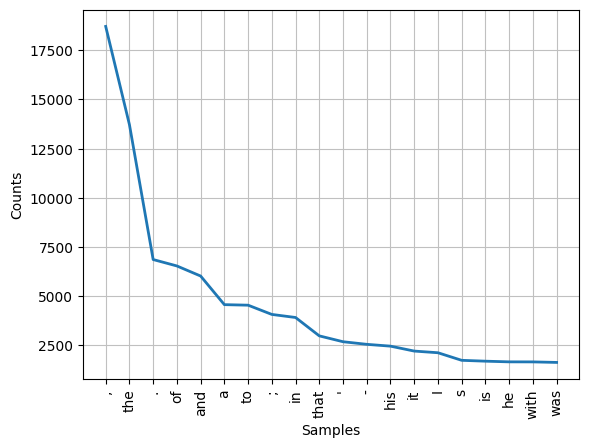

<Axes: xlabel='Samples', ylabel='Counts'>

In [ ]:
fdist.plot(20)

In [ ]:
fdist['monster'] # cuantas veces se repite esta palabra

49

## Distribuciones con filtro fino
* Cuando se saca la distribucion de los tokens mas repetidos suelen salir signos de puntuación y stopswords, para ello se crea un filtro que no incluya estos tokens

In [ ]:
long_words = [palabra for palabra in text1 if len(palabra)>5]
long_words

['Herman',
 'Melville',
 'ETYMOLOGY',
 'Supplied',
 'Consumptive',
 'Grammar',
 'School',
 'threadbare',
 'dusting',
 'lexicons',
 'grammars',
 'handkerchief',
 'mockingly',
 'embellished',
 'nations',
 'grammars',
 'somehow',
 'mildly',
 'reminded',
 'mortality',
 'school',
 'others',
 'called',
 'tongue',
 'leaving',
 'through',
 'ignorance',
 'letter',
 'almost',
 'maketh',
 'signification',
 'deliver',
 'HACKLUYT',
 'animal',
 'roundness',
 'rolling',
 'arched',
 'vaulted',
 'WEBSTER',
 'DICTIONARY',
 'immediately',
 'WALLEN',
 'wallow',
 'RICHARDSON',
 'DICTIONARY',
 'DANISH',
 'SWEDISH',
 'ICELANDIC',
 'ENGLISH',
 'BALEINE',
 'FRENCH',
 'BALLENA',
 'SPANISH',
 'ERROMANGOAN',
 'EXTRACTS',
 'Supplied',
 'Librarian',
 'painstaking',
 'burrower',
 'appears',
 'through',
 'Vaticans',
 'street',
 'stalls',
 'picking',
 'whatever',
 'random',
 'allusions',
 'whales',
 'anyways',
 'whatsoever',
 'sacred',
 'profane',
 'Therefore',
 'higgledy',
 'piggledy',
 'statements',
 'however',
 'au

In [ ]:
vocabulario_filtrado = sorted(set(long_words)) # Sorted organiza de mayor a menor, set muestra los tokens unicos
vocabulario_filtrado[:10] # los primeros 10 elementos

['ACCOUNT',
 'ADDITIONAL',
 'ADVANCING',
 'ADVENTURES',
 'AFFGHANISTAN',
 'AFRICA',
 'AGAINST',
 'ALFRED',
 'ALGERINE',
 'AMERICA']

In [ ]:
palabras_interesantes = [(palabra, fdist[palabra]) for palabra in set(text1) if len(palabra)>5 and fdist[palabra]>10 ]
palabras_interesantes

[('touching', 45),
 ('encounter', 16),
 ('grounds', 12),
 ('heaving', 15),
 ('strange', 96),
 ('critical', 14),
 ('shadows', 15),
 ('seeing', 28),
 ('measure', 15),
 ('shipmates', 22),
 ('binnacle', 16),
 ('conceit', 13),
 ('stricken', 16),
 ('standing', 73),
 ('thirty', 26),
 ('towards', 107),
 ('nailed', 11),
 ('chanced', 13),
 ('swinging', 13),
 ('theirs', 13),
 ('places', 20),
 ('desired', 11),
 ('resolved', 13),
 ('character', 14),
 ('pleasant', 16),
 ('mariner', 16),
 ('return', 13),
 ('tackles', 17),
 ('natural', 31),
 ('whalers', 19),
 ('themselves', 59),
 ('instead', 23),
 ('deadly', 22),
 ('leading', 11),
 ('whereas', 14),
 ('leviathan', 31),
 ('hollow', 20),
 ('quietly', 18),
 ('tomahawk', 17),
 ('seamen', 43),
 ('contrast', 12),
 ('speaking', 23),
 ('raised', 20),
 ('advanced', 11),
 ('Ramadan', 11),
 ('cunning', 15),
 ('watches', 12),
 ('against', 132),
 ('monkey', 15),
 ('enough', 74),
 ('superior', 14),
 ('without', 154),
 ('according', 20),
 ('hardly', 31),
 ('surface',

In [ ]:
# convertir la lista de tuplas en un array:
dtypes = [('word', 'S10'), ('frequency', int)]
palabras_interesantes = np.array(palabras_interesantes, dtype= dtypes)
palabras_interesantes

array([(b'touching',  45), (b'encounter',  16), (b'grounds',  12),
       (b'heaving',  15), (b'strange',  96), (b'critical',  14),
       (b'shadows',  15), (b'seeing',  28), (b'measure',  15),
       (b'shipmates',  22), (b'binnacle',  16), (b'conceit',  13),
       (b'stricken',  16), (b'standing',  73), (b'thirty',  26),
       (b'towards', 107), (b'nailed',  11), (b'chanced',  13),
       (b'swinging',  13), (b'theirs',  13), (b'places',  20),
       (b'desired',  11), (b'resolved',  13), (b'character',  14),
       (b'pleasant',  16), (b'mariner',  16), (b'return',  13),
       (b'tackles',  17), (b'natural',  31), (b'whalers',  19),
       (b'themselves',  59), (b'instead',  23), (b'deadly',  22),
       (b'leading',  11), (b'whereas',  14), (b'leviathan',  31),
       (b'hollow',  20), (b'quietly',  18), (b'tomahawk',  17),
       (b'seamen',  43), (b'contrast',  12), (b'speaking',  23),
       (b'raised',  20), (b'advanced',  11), (b'Ramadan',  11),
       (b'cunning',  15), (

In [ ]:
palabras_interesantes = np.sort(palabras_interesantes, order='frequency')

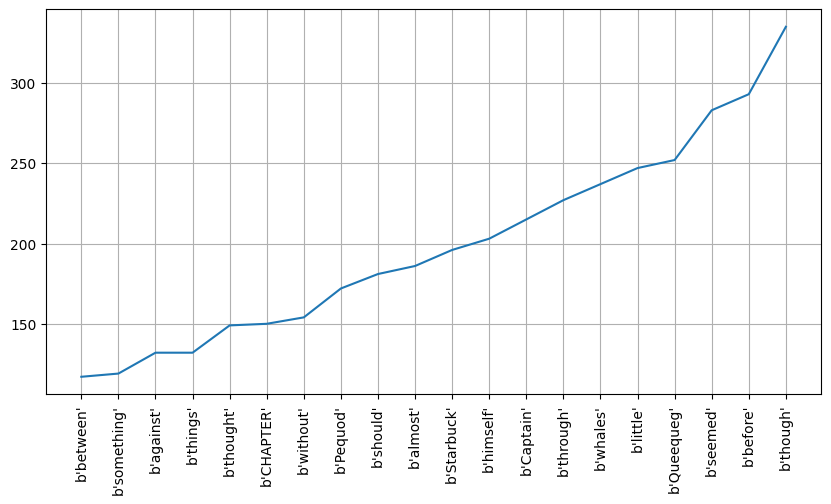

In [ ]:
top_words = 20
x = np.arange(len(palabras_interesantes[-top_words:]))
y = [freq[1] for freq in palabras_interesantes[-top_words:]]
plt.figure(figsize=(10,5))
plt.plot(x,y)
plt.xticks (x, [str(freq[0]) for freq in palabras_interesantes[-top_words:]], rotation='vertical')
plt.grid(True)
plt.show()

## Bi-gramas

In [ ]:
md_bigrams = list(bigrams(text1))
md_bigrams

[('[', 'Moby'),
 ('Moby', 'Dick'),
 ('Dick', 'by'),
 ('by', 'Herman'),
 ('Herman', 'Melville'),
 ('Melville', '1851'),
 ('1851', ']'),
 (']', 'ETYMOLOGY'),
 ('ETYMOLOGY', '.'),
 ('.', '('),
 ('(', 'Supplied'),
 ('Supplied', 'by'),
 ('by', 'a'),
 ('a', 'Late'),
 ('Late', 'Consumptive'),
 ('Consumptive', 'Usher'),
 ('Usher', 'to'),
 ('to', 'a'),
 ('a', 'Grammar'),
 ('Grammar', 'School'),
 ('School', ')'),
 (')', 'The'),
 ('The', 'pale'),
 ('pale', 'Usher'),
 ('Usher', '--'),
 ('--', 'threadbare'),
 ('threadbare', 'in'),
 ('in', 'coat'),
 ('coat', ','),
 (',', 'heart'),
 ('heart', ','),
 (',', 'body'),
 ('body', ','),
 (',', 'and'),
 ('and', 'brain'),
 ('brain', ';'),
 (';', 'I'),
 ('I', 'see'),
 ('see', 'him'),
 ('him', 'now'),
 ('now', '.'),
 ('.', 'He'),
 ('He', 'was'),
 ('was', 'ever'),
 ('ever', 'dusting'),
 ('dusting', 'his'),
 ('his', 'old'),
 ('old', 'lexicons'),
 ('lexicons', 'and'),
 ('and', 'grammars'),
 ('grammars', ','),
 (',', 'with'),
 ('with', 'a'),
 ('a', 'queer'),
 ('que

In [ ]:
fdist = FreqDist(md_bigrams)

In [ ]:
fdist.most_common

<bound method Counter.most_common of FreqDist({(',', 'and'): 2607, ('of', 'the'): 1847, ("'", 's'): 1737, ('in', 'the'): 1120, (',', 'the'): 908, (';', 'and'): 853, ('to', 'the'): 712, ('.', 'But'): 596, (',', 'that'): 584, ('.', '"'): 557, ...})>

Filtrado de bi-gramas

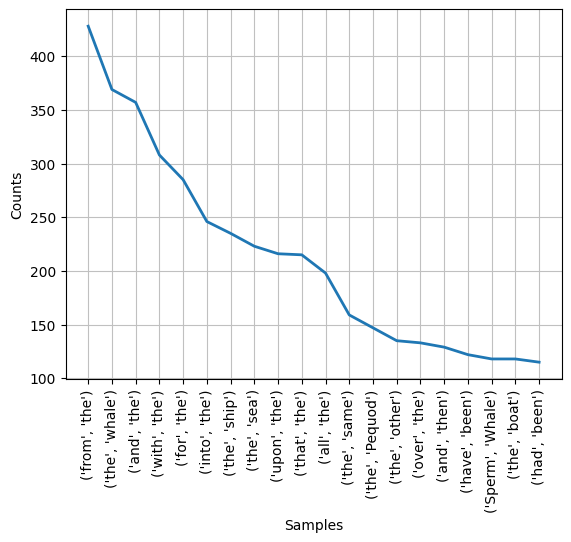

<Axes: xlabel='Samples', ylabel='Counts'>

In [ ]:
threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0])>threshold and len(bigram[1])>threshold]
filtered_dist = FreqDist(filtered_bigrams)
filtered_dist.plot(20)

## Tri gramas

In [ ]:
from nltk.util import ngrams
md_trigrams = list(ngrams(text1,3))
fdist = FreqDist(md_trigrams)
md_trigrams[:10]

[('[', 'Moby', 'Dick'),
 ('Moby', 'Dick', 'by'),
 ('Dick', 'by', 'Herman'),
 ('by', 'Herman', 'Melville'),
 ('Herman', 'Melville', '1851'),
 ('Melville', '1851', ']'),
 ('1851', ']', 'ETYMOLOGY'),
 (']', 'ETYMOLOGY', '.'),
 ('ETYMOLOGY', '.', '('),
 ('.', '(', 'Supplied')]

# Collocations (Colocaciones)

* Son secuencias de palabras que suelen ocurrir en textos o conversaciones con una **frecuencia inusualmente alta** [NLTK doc](http://www.nltk.org/book/ch01.html)
* Las colocaciones de una palabra son declaraciones formales de donde suele ubicarse tipicamente esa palabra [Manning & Schütze, 1990, Foundations of Statistical Natural Language Processing, Capítulo 6](https://nlp.stanford.edu/fsnlp/)

In [ ]:
md_bigrams = list(bigrams(text1))

threshold = 2
#distribution of bi-grams
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0])>threshold and len(bigram[1])>threshold]
filtered_bigram_dist = FreqDist(filtered_bigrams)
#distribution of words
filtered_words = [word for word in text1 if len(word)>threshold]
filtered_word_dist = FreqDist(filtered_words)

df = pd.DataFrame()
df['bi_gram'] = list(set(filtered_bigrams))
df['word_0'] = df['bi_gram'].apply(lambda x: x[0])
df['word_1'] = df['bi_gram'].apply(lambda x: x[1])
df['bi_gram_freq'] = df['bi_gram'].apply(lambda x: filtered_bigram_dist[x])
df['word_0_freq'] = df['word_0'].apply(lambda x: filtered_word_dist[x])
df['word_1_freq'] = df['word_1'].apply(lambda x: filtered_word_dist[x])
df

,bi_gram,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq
0,"(below, deck)",below,deck,1,46,189
1,"(laughing, bad)",laughing,bad,1,4,15
2,"(solitary, horseman)",solitary,horseman,1,19,3
3,"(worse, horrors)",worse,horrors,1,21,5
4,"(and, least)",and,least,1,6024,75
...,...,...,...,...,...,...
67937,"(gruff, voice)",gruff,voice,1,1,46
67938,"(did, beget)",did,beget,2,246,9
67939,"(still, clingest)",still,clingest,1,299,1
67940,"(like, slide)",like,slide,1,624,10


# Pointwise Mutual Information (PMI)
Una métrica basada en _teoria de la información_ para encontrar **Collocations**.

$$
PMI = \log\left(\frac{P(w_1, w_2)}{P(w_1)P(w_2)}\right)
$$


In [ ]:
df['PMI'] = df[['bi_gram_freq', 'word_0_freq', 'word_1_freq']].apply(lambda x:np.log2(x.values[0]/(x.values[1]*x.values[2])), axis = 1)
df['log(bi_gram_freq)'] = df['bi_gram_freq'].apply(lambda x: np.log2(x)) # Con esta linea se calcula el logaritmo de la columna bi_gram_freq
df

,bi_gram,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
0,"(below, deck)",below,deck,1,46,189,-13.085804,0.0
1,"(laughing, bad)",laughing,bad,1,4,15,-5.906891,0.0
2,"(solitary, horseman)",solitary,horseman,1,19,3,-5.832890,0.0
3,"(worse, horrors)",worse,horrors,1,21,5,-6.714246,0.0
4,"(and, least)",and,least,1,6024,75,-18.785325,0.0
...,...,...,...,...,...,...,...,...
67937,"(gruff, voice)",gruff,voice,1,1,46,-5.523562,0.0
67938,"(did, beget)",did,beget,2,246,9,-10.112440,1.0
67939,"(still, clingest)",still,clingest,1,299,1,-8.224002,0.0
67940,"(like, slide)",like,slide,1,624,10,-12.607330,0.0


In [ ]:
df.sort_values(by = 'PMI', ascending=False)

,bi_gram,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
50741,"(GOOD, BLOOD)",GOOD,BLOOD,1,1,1,0.000000,0.0
13547,"(Booble, Alley)",Booble,Alley,1,1,1,0.000000,0.0
21053,"(regina, caudam)",regina,caudam,1,1,1,0.000000,0.0
44986,"(Del, Fuego)",Del,Fuego,1,1,1,0.000000,0.0
12193,"(arbitrary, VEIN)",arbitrary,VEIN,1,1,1,0.000000,0.0
...,...,...,...,...,...,...,...,...
53185,"(man, the)",man,the,1,508,13721,-22.732783,0.0
46128,"(some, the)",some,the,1,578,13721,-22.919024,0.0
2628,"(one, the)",one,the,1,889,13721,-23.540138,0.0
25413,"(the, not)",the,not,1,13721,1103,-23.851315,0.0


In [ ]:
fig = px.scatter(x = df['PMI'].values, y = df['log(bi_gram_freq)'].values, color = df['PMI']+df['log(bi_gram_freq)'],
                 hover_name = df['bi_gram'], width = 600, height = 600, labels = {'x': 'PMI',
                                                                                  'y': 'Log(Bigram Frequency'})
fig.show()

# Medidas pre-construidas en NLTK

In [ ]:
# ver documentación https://www.nltk.org/_modules/nltk/metrics/association.html
from nltk.collocations import *
bigram_measures = nltk.collocations.BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(text1)

In [ ]:
finder.apply_freq_filter(20)
finder.nbest(bigram_measures.pmi, 10)

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('never', 'mind'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other')]

# Textos en Español

In [ ]:
# descargamos corpus en español  https://mailman.uib.no/public/corpora/2007-October/005448.html
nltk.download('cess_esp')
corpus = nltk.corpus.cess_esp.sents()
flatten_corpus = [w for l in corpus for w in l]

[nltk_data] Downloading package cess_esp to /root/nltk_data...
[nltk_data]   Unzipping corpora/cess_esp.zip.


In [ ]:
print(flatten_corpus[:50])

['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation', 'para', 'poner_en_marcha', 'una', 'central', 'de', 'gas', 'de', '495', 'megavatios', '.', 'Una', 'portavoz', 'de', 'EDF', 'explicó', 'a', 'EFE', 'que', 'el', 'proyecto']


In [ ]:
finder = BigramCollocationFinder.from_documents(corpus)
finder.apply_freq_filter(10)
finder.nbest(bigram_measures.pmi, 10)

[('señora', 'Aguirre'),
 ('secretario', 'general'),
 ('elecciones', 'generales'),
 ('campaña', 'electoral'),
 ('quiere', 'decir'),
 ('Se', 'trata'),
 ('segunda', 'vuelta'),
 ('director', 'general'),
 ('primer', 'ministro'),
 ('primer', 'lugar')]

# Recursos léxicos (lexicons)

*   Son colecciones de palabras o frases que tienen asociadas etiquetas o meta-informacion de algún tipo (POS tags, significados gramaticales, etc ...)

**comentario:** POS (Part of Speech), también llamado etiquetado gramatical o etiquetado de palabras por categorias, consiste en etiquetar la categoria gramatical a la que pertence cada palabra en un volumen de texto, siendo las categorias:

1.   Sustantivos
2.   Adjetivos
3.   Articulos
4.   Pronombres
5.   Verbos
6.   Adverbios
7.   Interjecciones
8.   Preposiciones
9.   Conjunciones

In [ ]:
from nltk.corpus import stopwords

In [ ]:
# Vocabularios: palabras únicas en un corpus
vocab = sorted(set(text1))

In [ ]:
# Distribuciones: frecuencia de aparición
word_freq = FreqDist(text1)

In [ ]:
# Stopwords: Palabras muy usadas en el lenguaje que usualmente son filtradas en un pipeline de NLP (useless words)
print(stopwords.words('spanish'))

['de', 'la', 'que', 'el', 'en', 'y', 'a', 'los', 'del', 'se', 'las', 'por', 'un', 'para', 'con', 'no', 'una', 'su', 'al', 'lo', 'como', 'más', 'pero', 'sus', 'le', 'ya', 'o', 'este', 'sí', 'porque', 'esta', 'entre', 'cuando', 'muy', 'sin', 'sobre', 'también', 'me', 'hasta', 'hay', 'donde', 'quien', 'desde', 'todo', 'nos', 'durante', 'todos', 'uno', 'les', 'ni', 'contra', 'otros', 'ese', 'eso', 'ante', 'ellos', 'e', 'esto', 'mí', 'antes', 'algunos', 'qué', 'unos', 'yo', 'otro', 'otras', 'otra', 'él', 'tanto', 'esa', 'estos', 'mucho', 'quienes', 'nada', 'muchos', 'cual', 'poco', 'ella', 'estar', 'estas', 'algunas', 'algo', 'nosotros', 'mi', 'mis', 'tú', 'te', 'ti', 'tu', 'tus', 'ellas', 'nosotras', 'vosotros', 'vosotras', 'os', 'mío', 'mía', 'míos', 'mías', 'tuyo', 'tuya', 'tuyos', 'tuyas', 'suyo', 'suya', 'suyos', 'suyas', 'nuestro', 'nuestra', 'nuestros', 'nuestras', 'vuestro', 'vuestra', 'vuestros', 'vuestras', 'esos', 'esas', 'estoy', 'estás', 'está', 'estamos', 'estáis', 'están', 'e

In [ ]:
def stopwords_percentage(text):
  '''
  aqui usamos un recurso léxico (stopwords) para filtrar un corpus
  '''
  stopwd = stopwords.words('english')
  content = [w  for w in text if w.lower() not in stopwd]
  return len(content)/len(text)

stopwords_percentage(text1)

0.5862954769399469

## Lexicons enriquecidos (listas comparativas de palabras)

*   Construyendo diccionarios para traduccion de palabras en diferentes idiomas.

In [ ]:
from nltk.corpus import swadesh
#idiomas disponibles
print(swadesh.fileids())

['be', 'bg', 'bs', 'ca', 'cs', 'cu', 'de', 'en', 'es', 'fr', 'hr', 'it', 'la', 'mk', 'nl', 'pl', 'pt', 'ro', 'ru', 'sk', 'sl', 'sr', 'sw', 'uk']


In [ ]:
print(swadesh.words('en'))

['I', 'you (singular), thou', 'he', 'we', 'you (plural)', 'they', 'this', 'that', 'here', 'there', 'who', 'what', 'where', 'when', 'how', 'not', 'all', 'many', 'some', 'few', 'other', 'one', 'two', 'three', 'four', 'five', 'big', 'long', 'wide', 'thick', 'heavy', 'small', 'short', 'narrow', 'thin', 'woman', 'man (adult male)', 'man (human being)', 'child', 'wife', 'husband', 'mother', 'father', 'animal', 'fish', 'bird', 'dog', 'louse', 'snake', 'worm', 'tree', 'forest', 'stick', 'fruit', 'seed', 'leaf', 'root', 'bark (from tree)', 'flower', 'grass', 'rope', 'skin', 'meat', 'blood', 'bone', 'fat (noun)', 'egg', 'horn', 'tail', 'feather', 'hair', 'head', 'ear', 'eye', 'nose', 'mouth', 'tooth', 'tongue', 'fingernail', 'foot', 'leg', 'knee', 'hand', 'wing', 'belly', 'guts', 'neck', 'back', 'breast', 'heart', 'liver', 'drink', 'eat', 'bite', 'suck', 'spit', 'vomit', 'blow', 'breathe', 'laugh', 'see', 'hear', 'know (a fact)', 'think', 'smell', 'fear', 'sleep', 'live', 'die', 'kill', 'fight',

In [ ]:
fr2es = swadesh.entries(['fr', 'es'])
print(fr2es)

[('je', 'yo'), ('tu, vous', 'tú, usted'), ('il', 'él'), ('nous', 'nosotros'), ('vous', 'vosotros, ustedes'), ('ils, elles', 'ellos, ellas'), ('ceci', 'este'), ('cela', 'ese, aquel'), ('ici', 'aquí, acá'), ('là', 'ahí, allí, allá'), ('qui', 'quien'), ('quoi', 'que'), ('où', 'donde'), ('quand', 'cuando'), ('comment', 'como'), ('ne...pas', 'no'), ('tout', 'todo'), ('plusieurs', 'muchos'), ('quelques', 'algunos, unos'), ('peu', 'poco'), ('autre', 'otro'), ('un', 'uno'), ('deux', 'dos'), ('trois', 'tres'), ('quatre', 'cuatro'), ('cinq', 'cinco'), ('grand', 'grande'), ('long', 'largo'), ('large', 'ancho'), ('épais', 'gordo'), ('lourd', 'pesado'), ('petit', 'pequeño'), ('court', 'corto'), ('étroit', 'estrecho, angosto'), ('mince', 'delgado, flaco'), ('femme', 'mujer'), ('homme', 'hombre'), ('homme', 'hombre'), ('enfant', 'niño'), ('femme, épouse', 'esposa, mujer'), ('mari, époux', 'esposo, marido'), ('mère', 'madre'), ('père', 'padre'), ('animal', 'animal'), ('poisson', 'pez, pescado'), ('ois

In [ ]:
translate = dict(fr2es)
translate['chien']

'perro'

In [ ]:
translate['jeter']

'tirar'

# WordNet

In [ ]:
import nltk
nltk.download('omw-1.4')
nltk.download('wordnet')
from nltk.corpus import wordnet as wn

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [ ]:
#synsets: grupo de sinonimos
ss = wn.synsets('carro', lang = 'spa')
ss

[Synset('car.n.01'),
 Synset('carriage.n.04'),
 Synset('carrier.n.02'),
 Synset('cart.n.01'),
 Synset('chariot.n.02'),
 Synset('cartload.n.01')]

In [ ]:
# explorar synsets
for syn in ss:
    print(syn.name(), ' : ', syn.definition())

car.n.01  :  a motor vehicle with four wheels; usually propelled by an internal combustion engine
carriage.n.04  :  a machine part that carries something else
carrier.n.02  :  a self-propelled wheeled vehicle designed specifically to carry something
cart.n.01  :  a heavy open wagon usually having two wheels and drawn by an animal
chariot.n.02  :  a two-wheeled horse-drawn battle vehicle; used in war and races in ancient Egypt and Greece and Rome
cartload.n.01  :  the quantity that a cart holds


In [ ]:
# explorar synsets
for syn in ss:
    print(syn.name(), ' : ', syn.definition())
    for name in syn.lemma_names():
        print(' * ',  name )

car.n.01  :  a motor vehicle with four wheels; usually propelled by an internal combustion engine
 *  car
 *  auto
 *  automobile
 *  machine
 *  motorcar
carriage.n.04  :  a machine part that carries something else
 *  carriage
carrier.n.02  :  a self-propelled wheeled vehicle designed specifically to carry something
 *  carrier
cart.n.01  :  a heavy open wagon usually having two wheels and drawn by an animal
 *  cart
chariot.n.02  :  a two-wheeled horse-drawn battle vehicle; used in war and races in ancient Egypt and Greece and Rome
 *  chariot
cartload.n.01  :  the quantity that a cart holds
 *  cartload


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

def clousure_graph(synset, fn):
  seen = set()
  graph = nx.DiGraph()
  labels = {}

  def recurse(s):
    if not s in seen:
      seen.add(s)
      labels[s.name] = s.name().split('.')[0]
      graph.add_node(s.name)
      for s1 in fn(s):
        graph.add_node(s1.name)
        graph.add_edge(s.name, s1.name)
        recurse(s1)
  recurse(synset)
  return graph, labels

def draw_text_graph(G, labels):
  plt.figure(figsize=(18, 12))
  pos = nx.planar_layout(G, scale=18)
  nx.draw_networkx_nodes(G, pos, node_color="red", linewidths=0, node_size=500)
  nx.draw_networkx_labels(G, pos, font_size=20, labels=labels)
  nx.draw_networkx_edges(G, pos)
  plt.xticks([])
  plt.yticks([])

**Hiponimos**

In [ ]:
ss[0].hyponyms()

[Synset('ambulance.n.01'),
 Synset('beach_wagon.n.01'),
 Synset('bus.n.04'),
 Synset('cab.n.03'),
 Synset('compact.n.03'),
 Synset('convertible.n.01'),
 Synset('coupe.n.01'),
 Synset('cruiser.n.01'),
 Synset('electric.n.01'),
 Synset('gas_guzzler.n.01'),
 Synset('hardtop.n.01'),
 Synset('hatchback.n.01'),
 Synset('horseless_carriage.n.01'),
 Synset('hot_rod.n.01'),
 Synset('jeep.n.01'),
 Synset('limousine.n.01'),
 Synset('loaner.n.02'),
 Synset('minicar.n.01'),
 Synset('minivan.n.01'),
 Synset('model_t.n.01'),
 Synset('pace_car.n.01'),
 Synset('racer.n.02'),
 Synset('roadster.n.01'),
 Synset('sedan.n.01'),
 Synset('sport_utility.n.01'),
 Synset('sports_car.n.01'),
 Synset('stanley_steamer.n.01'),
 Synset('stock_car.n.01'),
 Synset('subcompact.n.01'),
 Synset('touring_car.n.01'),
 Synset('used-car.n.01')]

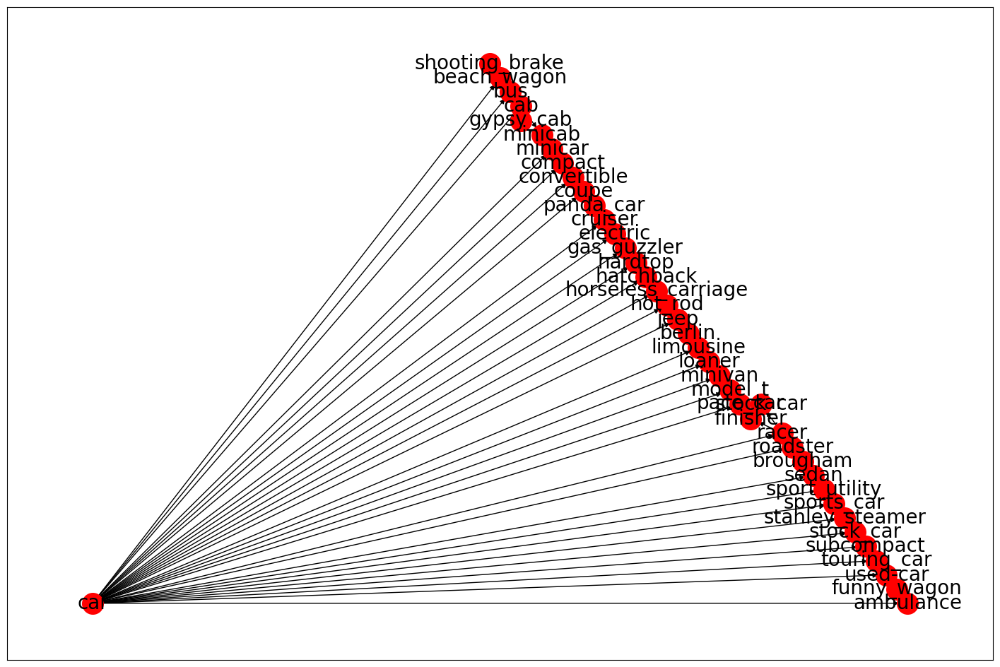

In [ ]:
G, labels = clousure_graph(ss[0], fn = lambda s: s.hyponyms())
draw_text_graph(G, labels)

**Hiperonimos**

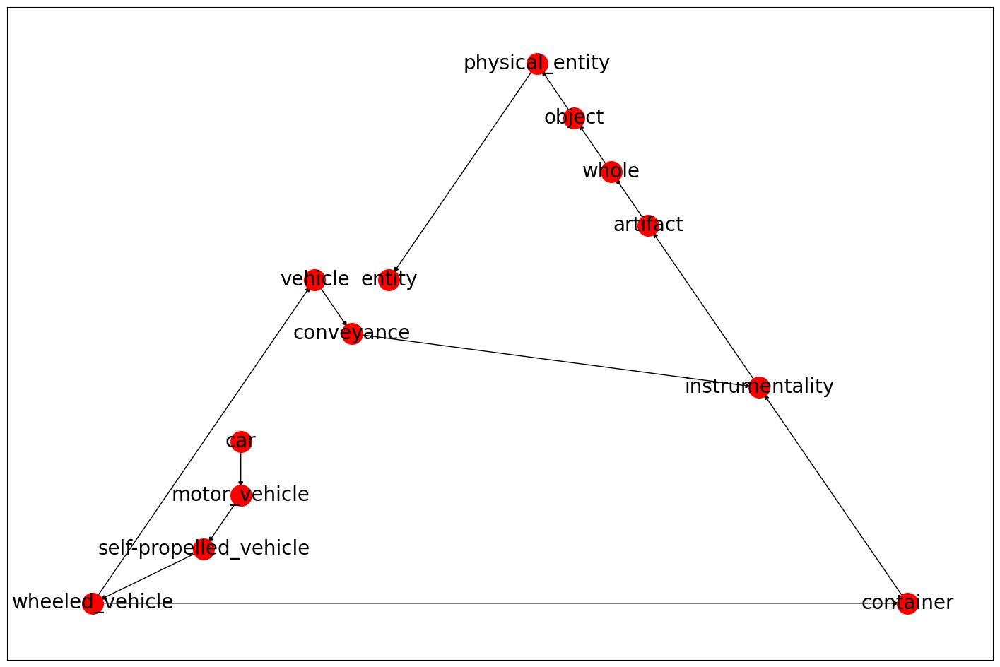

In [ ]:
G, labels = clousure_graph(ss[0], fn = lambda s: s.hypernyms())
draw_text_graph(G, labels)

In [ ]:
def show_syns(word):
  ss = wn.synsets(word, lang='spa')
  for syn in ss:
    print(syn.name(),' : ',syn.definition())
    for name in syn.lemma_names():
      print('*', name)
  return(ss)

ss = show_syns('perro')
ss2 = show_syns('gato')
ss3 = show_syns('animal')

perro = ss[0]
gato = ss2[0]
animal = ss3[0]

animal.path_similarity(perro)

animal.path_similarity(gato)

dog.n.01  :  a member of the genus Canis (probably descended from the common wolf) that has been domesticated by man since prehistoric times; occurs in many breeds
* dog
* domestic_dog
* Canis_familiaris
rotter.n.01  :  a person who is deemed to be despicable or contemptible
* rotter
* dirty_dog
* rat
* skunk
* stinker
* stinkpot
* bum
* puke
* crumb
* lowlife
* scum_bag
* so-and-so
* git
cat.n.01  :  feline mammal usually having thick soft fur and no ability to roar: domestic cats; wildcats
* cat
* true_cat
tom.n.02  :  male cat
* tom
* tomcat
dodger.n.01  :  a shifty deceptive person
* dodger
* fox
* slyboots
animal.n.01  :  a living organism characterized by voluntary movement
* animal
* animate_being
* beast
* brute
* creature
* fauna
beast.n.02  :  a cruelly rapacious person
* beast
* wolf
* savage
* brute
* wildcat
dunce.n.01  :  a stupid person; these words are used to express a low opinion of someone's intelligence
* dunce
* dunderhead
* numskull
* blockhead
* bonehead
* lunkhe

0.125

In [ ]:
animal.path_similarity(perro)

0.3333333333333333

In [ ]:
animal.path_similarity(gato)

0.125

# Procesar texto plano desde Web

In [1]:
# Librerias a Usar
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk import word_tokenize
from urllib import request

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [2]:
url = "http://www.gutenberg.org/files/2554/2554-0.txt"
response = request.urlopen(url) # Metodo para obtener la respuesta de la url
raw = response.read().decode('utf8') # metodo para leer el texto y decodificarlo

In [3]:
raw

'\ufeffThe Project Gutenberg eBook of Crime and Punishment, by Fyodor Dostoevsky\r\n\r\nThis eBook is for the use of anyone anywhere in the United States and\r\nmost other parts of the world at no cost and with almost no restrictions\r\nwhatsoever. You may copy it, give it away or re-use it under the terms\r\nof the Project Gutenberg License included with this eBook or online at\r\nwww.gutenberg.org. If you are not located in the United States, you\r\nwill have to check the laws of the country where you are located before\r\nusing this eBook.\r\n\r\nTitle: Crime and Punishment\r\n\r\nAuthor: Fyodor Dostoevsky\r\n\r\nTranslator: Constance Garnett\r\n\r\nRelease Date: March, 2001 [eBook #2554]\r\n[Most recently updated: August 6, 2021]\r\n\r\nLanguage: English\r\n\r\nCharacter set encoding: UTF-8\r\n\r\nProduced by: John Bickers, Dagny and David Widger\r\n\r\n*** START OF THE PROJECT GUTENBERG EBOOK CRIME AND PUNISHMENT ***\r\n\r\n\r\n\r\n\r\nCRIME AND PUNISHMENT\r\n\r\nBy Fyodor Dostoev

In [6]:
with open('book.txt', 'w')as f:
  f.write(raw)

In [7]:
len(raw)

1176812

In [8]:
tokens = word_tokenize(raw)
print(tokens[:20])

['\ufeffThe', 'Project', 'Gutenberg', 'eBook', 'of', 'Crime', 'and', 'Punishment', ',', 'by', 'Fyodor', 'Dostoevsky', 'This', 'eBook', 'is', 'for', 'the', 'use', 'of', 'anyone']


In [9]:
text = nltk.Text(tokens)
text.collocations()

Katerina Ivanovna; Pyotr Petrovitch; Pulcheria Alexandrovna; Avdotya
Romanovna; Rodion Romanovitch; Marfa Petrovna; Sofya Semyonovna; old
woman; Project Gutenberg-tm; Porfiry Petrovitch; Amalia Ivanovna;
great deal; young man; Nikodim Fomitch; Project Gutenberg; Ilya
Petrovitch; Andrey Semyonovitch; Hay Market; Dmitri Prokofitch; Good
heavens


## Procesar HTML

In [10]:
import requests
from bs4 import BeautifulSoup
import re
from nltk.tokenize import RegexpTokenizer
url = 'https://www.gutenberg.org/files/2701/2701-h/2701-h.htm'
r = requests.get(url)

In [11]:
html = r.text
html

'<!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Strict//EN"\r\n"http://www.w3.org/TR/xhtml1/DTD/xhtml1-strict.dtd">\r\n<html xmlns="http://www.w3.org/1999/xhtml" xml:lang="en" lang="en">\r\n<head>\r\n<meta http-equiv="Content-Type" content="text/html;charset=utf-8" />\r\n<meta http-equiv="Content-Style-Type" content="text/css" />\r\n<title>The Project Gutenberg eBook of Moby Dick; Or the Whale, by Herman Melville</title>\r\n\r\n<style type="text/css" xml:space="preserve">\r\n\r\n    body {margin-left:15%; margin-right:15%; text-align:justify }\r\n    p { text-indent: 1em; margin-top: .25em; margin-bottom: .25em; }\r\n    H1,H2,H3,H4,H5,H6 { text-align: center; margin-left: 15%; margin-right: 15%; }\r\n    hr  { width: 50%; text-align: center;}\r\n    blockquote {font-size: 100%; margin-left: 0%; margin-right: 0%;}\r\n    .mynote    {background-color: #DDE; color: #000; padding: .5em; margin-left: 10%; margin-right: 10%; font-family: sans-serif; font-size: 95%;}\r\n    .toc       { margin

In [12]:
soup = BeautifulSoup(html, 'html.parser')
soup

<!DOCTYPE html PUBLIC "-//W3C//DTD XHTML 1.0 Strict//EN"
"http://www.w3.org/TR/xhtml1/DTD/xhtml1-strict.dtd">

<html lang="en" xml:lang="en" xmlns="http://www.w3.org/1999/xhtml">
<head>
<meta content="text/html;charset=utf-8" http-equiv="Content-Type"/>
<meta content="text/css" http-equiv="Content-Style-Type"/>
<title>The Project Gutenberg eBook of Moby Dick; Or the Whale, by Herman Melville</title>
<style type="text/css" xml:space="preserve">

    body {margin-left:15%; margin-right:15%; text-align:justify }
    p { text-indent: 1em; margin-top: .25em; margin-bottom: .25em; }
    H1,H2,H3,H4,H5,H6 { text-align: center; margin-left: 15%; margin-right: 15%; }
    hr  { width: 50%; text-align: center;}
    blockquote {font-size: 100%; margin-left: 0%; margin-right: 0%;}
    .mynote    {background-color: #DDE; color: #000; padding: .5em; margin-left: 10%; margin-right: 10%; font-family: sans-serif; font-size: 95%;}
    .toc       { margin-left: 10%; margin-bottom: .75em;}
    pre        {

In [13]:
text = soup.get_text()

In [14]:
tokens = re.findall('\w+', text)
tokens[:10]

['The',
 'Project',
 'Gutenberg',
 'eBook',
 'of',
 'Moby',
 'Dick',
 'Or',
 'the',
 'Whale']

In [15]:
tokenizer = RegexpTokenizer('\w+')
tokens = tokenizer.tokenize(text)
tokens = [token.lower() for token in tokens]
tokens[:10]

['the',
 'project',
 'gutenberg',
 'ebook',
 'of',
 'moby',
 'dick',
 'or',
 'the',
 'whale']

In [16]:
text = nltk.Text(tokens)
text.collocations()

sperm whale; moby dick; project gutenberg; white whale; old man; mast
head; mast heads; captain ahab; right whale; quarter deck; united
states; aye aye; captain peleg; new bedford; literary archive; mrs
hussey; dough boy; chief mate; gutenberg electronic; try works


# CONFIGURACION ESTRUCTURADA EN GOOGLE DRIVE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
filepath = '/content/drive/My Drive/Colab Notebooks/NLP_course_resources/'

In [ ]:
import re

# la funcion la podemos definir en el notebook y usar directamente
def get_text(file):
  '''Read Text from file'''
  text = open(file).read()
  text = re.sub(r'<.*?>', ' ', text)
  text = re.sub(r'\s+', ' ', text)
  return text

In [ ]:
text = get_text(filepath+'book.txt')

In [ ]:
# será mas comodo definir la funcion dentro de una libreria externa
!touch /content/drive/My\ Drive/Colab\ Notebooks/NLP_course_resources/read.py

In [ ]:
import sys
sys.path.append(filepath)
import read
read.get_text(filepath+'book.txt')

In [ ]:
import nltk
nltk.download('punkt')
from urllib import request
from bs4 import BeautifulSoup
from nltk import word_tokenize

# la funcion la podemos definir en el notebook y usar directamente
def freq_words(url, n, encoding = 'utf8'):
  req = request.urlopen(url)
  html = req.read().decode(encoding)
  raw = BeautifulSoup(html, 'html.parser')
  text = raw.get_text()
  tokens = word_tokenize(text)
  tokens = [t.lower() for t in tokens]
  fd = nltk.FreqDist(tokens)
  return [t for (t, _) in fd.most_common(n)]

In [ ]:
freq_words('https://www.gutenberg.org/files/2701/2701-h/2701-h.htm', 20)

In [ ]:
# será mas comodo definir la funcion dentro de una libreria externa
!touch /content/drive/My\ Drive/Colab\ Notebooks/NLP_course_resources/nlp_utils.py

In [ ]:
import nlp_utils
nlp_utils.freq_words('https://www.gutenberg.org/files/2701/2701-h/2701-h.htm', 20)